# K-Means Clustering of IMU and Odometry Data from TurtleBot3
### By Jacob Laframboise
Here we take in a dataset of imu data recorded from the TurtleBot3 Waffle Pi driving on 2 different surfaces at 4 different speeds each, and use K-means clustering to assign each data point to a cluster. Then we use PCA to visualize this high (118) dimension data in 2 or 3 dimensions. Matplotlib is used to plot in 2D, and Plotly is used to plot in 3D interactively, so we can better see the clusters. 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import plotly as ply
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
%matplotlib notebook

pd.set_option('display.max_columns', 60)
pd.set_option('display.max_rows', 80)

In [2]:
dataFolder = r"C:\Users\jaker\Documents\RoboData-Experiment1"
data = "AllDataDf.csv"


df = pd.read_csv(os.path.join(dataFolder, data))

In [3]:
df = df.rename(columns={'Unnamed: 0': 'Seq'})
df = df.set_index('Seq')

In [4]:
print(df.isnull().sum().sum()) # check for NaN
df.shape

0


(133284, 118)

### Kmeans
#### Now that we have processed the data, we can apply Kmeans to cluster it.

In [5]:
scaler = StandardScaler()
df = pd.DataFrame(scaler.fit_transform(df))

In [6]:
kmeans = KMeans(n_clusters=8)
kmeans.fit(df)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [7]:
labels = kmeans.predict(df)
centroids = kmeans.cluster_centers_

In [8]:
df['Cluster'] = labels

In [9]:
df.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,...,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,Cluster
0,1.339089,1.859821,1.673872,-2.462582,1.055963,-0.058837,0.045108,-0.673343,-0.532989,0.975006,0.842063,1.382699,-0.389494,0.063550,-0.726458,-0.361137,-0.216702,0.116205,-0.113147,0.073104,-0.097480,-0.034496,0.092365,0.107708,0.126459,0.654091,0.812041,0.715219,1.289849,1.401138,...,-0.025199,1.885276,2.521557,1.069767,0.759937,0.560025,0.209456,-0.919525,-0.522969,0.026215,-0.266801,-0.218640,-0.190296,0.723901,0.931041,0.912485,-1.075951,-0.474819,-0.489166,0.157921,-0.180628,-0.553391,-0.933731,-0.628760,-1.210564,0.012118,0.366319,-0.020307,0.138410,4
1,1.339108,1.859899,1.673839,-2.462478,1.068275,-0.093863,-0.083801,-0.635992,-0.532987,0.975019,0.625200,0.082257,-0.026339,-0.078106,-0.746607,-0.969489,-0.238674,-0.169333,-0.119649,0.063305,-0.140763,-0.135684,0.092365,0.107708,0.126459,0.651817,0.792699,0.715219,1.289849,1.401138,...,-1.288747,1.032439,1.307502,0.000239,0.367870,0.560025,0.628191,-0.649054,0.000123,0.591134,-0.001321,-0.127125,-0.273283,0.630303,1.151947,0.982779,-0.892582,-0.018271,-0.426615,0.144598,-0.909116,-0.646155,-0.962007,-0.456943,-1.279903,-0.407162,-0.768895,-0.280865,-0.165824,4
2,1.339127,1.859977,1.673806,-2.462375,1.080588,-0.128889,-0.319720,-0.633406,-0.532976,0.975027,0.083044,-0.225742,-0.026339,0.069216,-0.510574,-1.087000,-0.237329,-0.327383,-0.149763,0.072768,-0.127846,-0.124568,0.092365,0.107708,0.126459,0.649543,0.773357,0.715219,1.289849,1.401138,...,-1.819437,1.571073,0.070101,-1.106170,1.127500,0.560025,0.697980,-0.703148,0.000123,1.667172,-0.213705,0.005064,-0.160931,0.952280,1.416520,-0.181691,-0.103746,0.196884,-0.197885,0.291150,-0.940199,-0.751214,-0.881529,-0.545195,-1.026798,-1.201285,-1.473169,-1.190907,-0.217592,4
3,1.339146,1.860055,1.673773,-2.462271,1.092901,-0.163915,-0.383935,-0.677382,-0.532990,0.975003,-0.404898,0.458701,-0.389494,0.796386,-0.041388,-0.232188,-0.219169,-0.330132,-0.164265,-0.144158,-0.165912,-0.154192,0.092365,0.107708,0.126459,0.647269,0.754015,0.715219,1.289849,1.401138,...,-0.682244,0.718236,-0.046635,-0.614433,1.617584,-0.559841,0.000088,-0.270395,-0.156804,1.398163,-0.479185,0.784637,0.495303,0.947288,1.435143,0.365042,0.429065,0.642937,0.444428,-0.024792,-0.720681,-0.386862,-0.526987,0.553658,0.084680,-1.093778,-1.110383,-0.562819,0.399128,4
4,1.339165,1.860134,1.673740,-2.462168,1.105214,-0.198941,-0.422209,-0.695000,-0.533005,0.974987,-0.432005,0.954922,-0.534756,1.382844,0.026256,0.172860,0.116499,-0.087129,0.021570,-0.042648,0.017975,-0.031392,0.092365,0.107708,0.126459,0.480384,0.734673,0.715219,1.289849,1.401138,...,-0.315815,-0.302924,-0.291781,-0.700487,2.536491,-0.783814,-0.139490,0.054170,-0.156804,2.205191,-0.744664,1.178660,0.891725,0.685838,1.358083,0.071794,1.251807,0.489443,0.488307,-0.001002,-0.772161,-0.747861,-0.388868,0.946106,0.350766,-0.902056,-1.054652,-0.412672,0.416759,4
5,1.339214,1.860332,1.672764,-2.459097,1.048431,-0.734124,-0.460484,-0.712618,-0.533021,0.974971,-0.459113,1.451144,-0.680018,1.969301,0.093899,0.577908,0.257380,0.027547,-0.105184,-0.014225,-0.136943,0.026398,0.919589,0.590166,0.409800,0.477731,0.807638,0.762599,2.557788,2.089800,...,1.010910,-0.246817,-0.560273,-0.282510,2.548743,-0.447854,-0.628014,0.000076,-0.470660,2.474200,-0.691568,1.052403,1.383901,1.085813,1.473031,0.662550,2.081469,0.123417,0.545256,0.120808,-0.217538,-0.468450,-0.137644,0.608328,1.016492,-0.276362,-0.502664,0.071766,0.206309,4
6,1.339262,1.860530,1.671787,-2.456026,0.991649,-1.269307,-0.485790,-0.739275,-0.533061,0.974934,-0.133819,1.793366,-1.043173,1.990078,0.476732,0.601827,-0.016930,0.071789,-0.189614,-0.132276,-0.227844,0.061719,1.746812,1.072624,0.693141,0.475078,0.862774,0.809979,3.825727,2.778461,...,1.491059,-0.291703,0.280226,0.024825,1.838121,-0.783814,-0.976960,-0.216301,-0.862980,2.581804,-0.532281,0.544834,1.2

In [10]:
pca_1d = PCA(n_components=1)
pca_2d = PCA(n_components=2)
pca_3d = PCA(n_components=3)

In [11]:
pc1Df = pd.DataFrame(pca_1d.fit_transform(df.drop(columns=['Cluster'])))
pc2Df = pd.DataFrame(pca_2d.fit_transform(df.drop(columns=['Cluster'])))
pc3Df = pd.DataFrame(pca_3d.fit_transform(df.drop(columns=['Cluster'])))

In [12]:
pc1Df.columns = ["PC1_1d"]
pc2Df.columns = ["PC1_2d", "PC2_2d"]
pc3Df.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]

In [13]:
pc3Df.head()

,PC1_3d,PC2_3d,PC3_3d
0,-4.999723,5.589396,-0.257147
1,-4.525993,5.700499,-1.852820
2,-4.154878,5.724693,-2.208828
3,-4.352018,5.618386,-0.411295
4,-4.271504,5.527088,0.226002


In [14]:
pc3Df.tail()

,PC1_3d,PC2_3d,PC3_3d
133279,0.468844,1.948960,2.340927
133280,0.672652,1.853561,3.326134
133281,-1.294350,1.768112,4.698389
133282,-2.595873,1.880864,5.447635
133283,-2.170127,1.997603,6.319259


In [15]:
df = pd.concat([df, pc1Df, pc2Df, pc3Df], axis=1, join='inner')
df['Zeros']=0

In [16]:
c0 = df[df['Cluster']==0]
c1 = df[df['Cluster']==1]
c2 = df[df['Cluster']==2]
c3 = df[df['Cluster']==3]
c4 = df[df['Cluster']==4]
c5 = df[df['Cluster']==5]
c6 = df[df['Cluster']==6]
c7 = df[df['Cluster']==7]

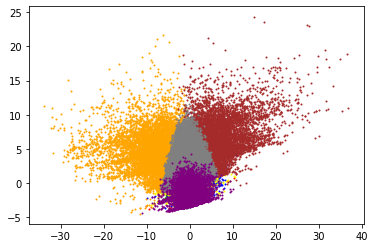

In [17]:
plt.figure()
plt.scatter(x=c0['PC1_2d'], y=c0['PC2_2d'], c='red', s=1)
plt.scatter(x=c1['PC1_2d'], y=c1['PC2_2d'], c='blue', s=1)
plt.scatter(x=c2['PC1_2d'], y=c2['PC2_2d'], c='green', s=1)
plt.scatter(x=c3['PC1_2d'], y=c3['PC2_2d'], c='yellow', s=1)
plt.scatter(x=c4['PC1_2d'], y=c4['PC2_2d'], c='orange', s=1)
plt.scatter(x=c5['PC1_2d'], y=c5['PC2_2d'], c='brown', s=1)
plt.scatter(x=c6['PC1_2d'], y=c6['PC2_2d'], c='grey', s=1)
plt.scatter(x=c7['PC1_2d'], y=c7['PC2_2d'], c='purple', s=1)

In [18]:
init_notebook_mode(connected=True)

In [21]:
t0 = go.Scatter3d(x=c0['PC1_3d'], y=c0['PC2_3d'], z=c0['PC3_3d'],
               mode="markers", name="Cluster 0",
               marker = dict(color = 'purple'),
               text=None)
t1 = go.Scatter3d(x=c1['PC1_3d'], y=c1['PC2_3d'], z=c1['PC3_3d'],
               mode="markers", name="Cluster 1",
               marker = dict(color = 'brown'),
               text=None)
t2 = go.Scatter3d(x=c2['PC1_3d'], y=c2['PC2_3d'], z=c2['PC3_3d'],
               mode="markers", name="Cluster 2",
               marker = dict(color = 'grey'),
               text=None)
t3 = go.Scatter3d(x=c3['PC1_3d'], y=c3['PC2_3d'], z=c3['PC3_3d'],
               mode="markers", name="Cluster 3",
               marker = dict(color = 'blue'),
               text=None)
t4 = go.Scatter3d(x=c4['PC1_3d'], y=c4['PC2_3d'], z=c4['PC3_3d'],
               mode="markers", name="Cluster 4",
               marker = dict(color = 'green'),
               text=None)
t5 = go.Scatter3d(x=c5['PC1_3d'], y=c5['PC2_3d'], z=c5['PC3_3d'],
               mode="markers", name="Cluster 5",
               marker = dict(color = 'orange'),
               text=None)
t6 = go.Scatter3d(x=c6['PC1_3d'], y=c6['PC2_3d'], z=c6['PC3_3d'],
               mode="markers", name="Cluster 6",
               marker = dict(color = 'red'),
               text=None)
t7 = go.Scatter3d(x=c7['PC1_3d'], y=c7['PC2_3d'], z=c7['PC3_3d'],
               mode="markers", name="Cluster 7",
               marker = dict(color = 'yellow'),
               text=None)
plotData = [t0, t1, t2, t3, t4, t5, t6, t7]
title = "IMU Clustering"
layout = dict(title=title, xaxis=dict(title='PC1',ticklen= 5,zeroline= False), yaxis=dict(title= '',ticklen= 5,zeroline= False))

fig=dict(data=plotData, layout=layout)

In [22]:
iplot(fig)